# **NADILA IMAARAH**

# **3. CLUSTERING DATA WINE**

# **A. IMPORT LIBRARY DAN LOAD DATASET**

In [5]:
from pycaret.datasets import get_data
import pandas as pd
from ydata_profiling import ProfileReport
from pycaret.clustering import *
from sklearn.metrics import silhouette_score

data = get_data('wine')
data.drop(columns=['quality', 'type'], inplace=True)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


# **B. IMPORT LIBRARY DAN LOAD DATASET**

In [6]:
profile = ProfileReport(data, title='Wine Dataset Profiling Report')
profile.to_file("wine_profile.html")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 11/11 [00:00<00:00, 3847.34it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# **C. SETUP**

In [7]:
clu = ClusteringExperiment()
clu.setup(data=data, session_id=123)

,Description,Value
0,Session id,123
1,Original data shape,"(6497, 11)"
2,Transformed data shape,"(6497, 11)"
3,Numeric features,11
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,CPU Jobs,-1
9,Use GPU,False


# **D. COMPARE**

In [ ]:
best_model = clu.compare_models()

# **E. EVALUATE**

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4511,14190.6347,0.7164,0,0,0


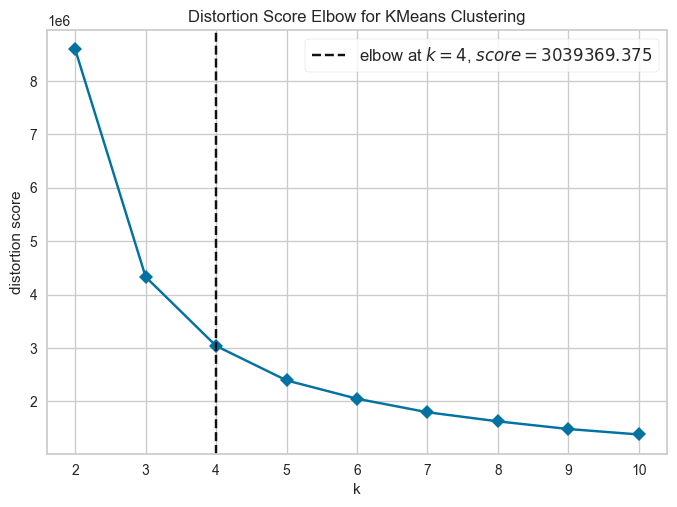

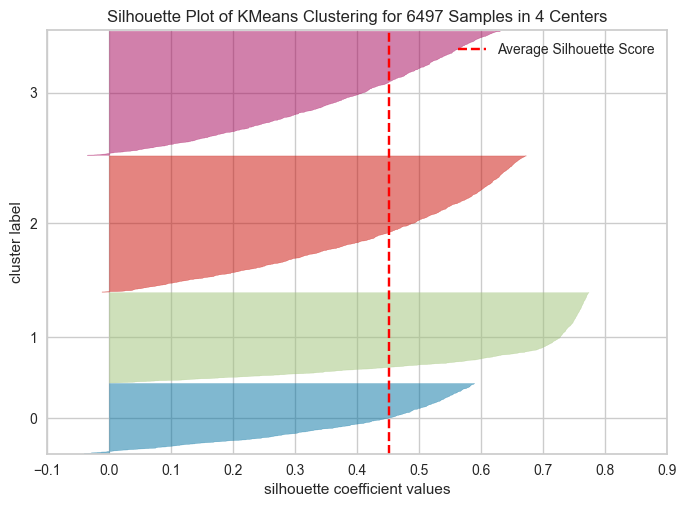

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
model = clu.create_model('kmeans')  # default cluster=4
assigned = clu.assign_model(model)

clu.plot_model(model, plot='cluster')
clu.plot_model(model, plot='elbow')
clu.plot_model(model, plot='silhouette')

# Interaktif evaluasi
clu.evaluate_model(model)

# **F. TUNNNING MANUAL**

In [9]:
scores = {}
for k in range(2, 11):
    model_k = clu.create_model('kmeans', num_clusters=k)
    assigned_k = clu.assign_model(model_k)
    
    # Hitung silhouette score
    score = silhouette_score(assigned_k.drop(columns='Cluster'), assigned_k['Cluster'])
    scores[k] = score
    print(f'Clusters: {k}, Silhouette Score: {score:.4f}')

# Cari jumlah cluster optimal
optimal_k = max(scores, key=scores.get)
print(f"Optimal number of clusters based on silhouette score: {optimal_k}")

# Buat ulang model dengan jumlah cluster optimal
optimal_model = clu.create_model('kmeans', num_clusters=optimal_k)
clu.plot_model(optimal_model, plot='cluster')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5102,10870.7676,0.6719,0,0,0


Clusters: 2, Silhouette Score: 0.5102


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5040,13969.4886,0.6411,0,0,0


Clusters: 3, Silhouette Score: 0.5040


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4511,14190.6347,0.7164,0,0,0


Clusters: 4, Silhouette Score: 0.4511


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4178,13947.3894,0.7727,0,0,0


Clusters: 5, Silhouette Score: 0.4178


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3834,13240.7529,0.8282,0,0,0


Clusters: 6, Silhouette Score: 0.3834


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3656,12738.1845,0.8908,0,0,0


Clusters: 7, Silhouette Score: 0.3656


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3668,12158.3109,0.9081,0,0,0


Clusters: 8, Silhouette Score: 0.3668


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3448,11741.6736,0.9251,0,0,0


Clusters: 9, Silhouette Score: 0.3448


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3309,11260.8874,0.9373,0,0,0


Clusters: 10, Silhouette Score: 0.3309
Optimal number of clusters based on silhouette score: 2


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5102,10870.7676,0.6719,0,0,0


# **G. DEPLOY DASHBOARD**

In [10]:
clu.evaluate_model(optimal_model)

# Simpan model dengan konteks eksperimen (tidak pakai global)
clu.save_model(optimal_model, 'best_kmeans_wine_model')

# Load model kembali (opsional)
loaded_model = clu.load_model('best_kmeans_wine_model')

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Transformation Pipeline and Model Successfully Saved
Transformation Pipeline and Model Successfully Loaded
